In [2]:
# dirvae_with_viz.py
# Dirichlet Variational Autoencoder (DirVAE) with visualizations
# Based on Joo et al., "Dirichlet Variational Autoencoder" (ICLR 2019)

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Uniform
import matplotlib.pyplot as plt
import torchvision
import torchvision.transforms as T
import torchvision.utils as vutils
from torch.utils.data import DataLoader

EPS = 1e-8

In [3]:
# -------------------------------------------------------------------
# Model definitions
# -------------------------------------------------------------------

class MLPEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dims, latent_dim):
        super().__init__()
        layers = []
        last = input_dim
        for h in hidden_dims:
            layers.append(nn.Linear(last, h))
            layers.append(nn.ReLU(inplace=True))
            last = h
        self.net = nn.Sequential(*layers)
        self.alpha_layer = nn.Linear(last, latent_dim)

    def forward(self, x):
        h = self.net(x)
        alpha_hat = F.softplus(self.alpha_layer(h)) + 1e-6
        alpha_hat = torch.clamp(alpha_hat, min=1e-3, max=1e3)
        return alpha_hat


class BernoulliDecoder(nn.Module):
    def __init__(self, latent_dim, hidden_dims, output_dim):
        super().__init__()
        layers = []
        last = latent_dim
        for h in hidden_dims:
            layers.append(nn.Linear(last, h))
            layers.append(nn.ReLU(inplace=True))
            last = h
        layers.append(nn.Linear(last, output_dim))
        self.net = nn.Sequential(*layers)

    def forward(self, z):
        logits = self.net(z)
        return logits


class DirVAE(nn.Module):
    def __init__(self, input_dim, enc_hidden_dims, dec_hidden_dims, latent_dim,
                 prior_alpha=None, beta=1.0):
        super().__init__()
        self.latent_dim = latent_dim
        self.encoder = MLPEncoder(input_dim, enc_hidden_dims, latent_dim)
        self.decoder = BernoulliDecoder(latent_dim, dec_hidden_dims, input_dim)

        if prior_alpha is None:
            prior_alpha = torch.ones(latent_dim) * 0.98
        elif torch.is_tensor(prior_alpha):
            if prior_alpha.numel() == 1:
                prior_alpha = prior_alpha.repeat(latent_dim)
        else:
            prior_alpha = torch.tensor(float(prior_alpha)).repeat(latent_dim)

        self.register_buffer('prior_alpha', prior_alpha.float())
        self.beta = float(beta)

    def inverse_gamma_cdf_approx(self, u, alpha):
        log_gamma = torch.lgamma(alpha)
        a_gamma = alpha * torch.exp(log_gamma)
        u = u.clamp(min=EPS, max=1.0 - 1e-12)
        base = (u * a_gamma).clamp(min=EPS)
        samples = (base) ** (1.0 / alpha)
        samples = samples / (self.beta + 0.0)
        return samples

    def sample_dirichlet_from_alpha(self, alpha_hat):
        batch = alpha_hat.shape[0]
        u = torch.rand_like(alpha_hat)
        v = self.inverse_gamma_cdf_approx(u, alpha_hat)
        denom = v.sum(dim=1, keepdim=True).clamp(min=EPS)
        z = v / denom
        return z, v, u

    def forward(self, x):
        alpha_hat = self.encoder(x)
        z, v, u = self.sample_dirichlet_from_alpha(alpha_hat)
        logits = self.decoder(z)
        return logits, z, alpha_hat, v

In [4]:
# -------------------------------------------------------------------
# Loss function
# -------------------------------------------------------------------

def multi_gamma_kl(alpha_hat, prior_alpha, reduction='batchmean'):
    if prior_alpha.dim() == 1:
        prior = prior_alpha.unsqueeze(0).expand_as(alpha_hat)
    else:
        prior = prior_alpha
    term1 = torch.lgamma(prior) - torch.lgamma(alpha_hat)
    term2 = (alpha_hat - prior) * torch.digamma(alpha_hat)
    kl_comp = term1 + term2
    kl = kl_comp.sum(dim=1)
    if reduction == 'batchmean':
        return kl.mean()
    elif reduction == 'sum':
        return kl.sum()
    else:
        return kl


def dirvae_elbo_loss(model, x, reduction='mean'):
    logits, z, alpha_hat, v = model(x)
    bce = F.binary_cross_entropy_with_logits(logits, x, reduction='none')
    recon_per_sample = bce.sum(dim=1)
    recon_loss = recon_per_sample.mean() if reduction == 'mean' else recon_per_sample.sum()
    kl = multi_gamma_kl(alpha_hat, model.prior_alpha, reduction='batchmean')
    loss = recon_loss + kl
    return loss, recon_loss, kl

In [5]:
from plotting import plot_training_progress, plot_final_results, plot_dirichlet_simplex_nD

def train_dirvae(epochs=10, latent_dim=50, device=None):
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")

    transform = T.Compose([T.ToTensor(), lambda t: t.view(-1)])
    trainset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
    loader = DataLoader(trainset, batch_size=128, shuffle=True, num_workers=0)

    input_dim = 28 * 28
    model = DirVAE(
        input_dim=input_dim,
        enc_hidden_dims=[400],
        dec_hidden_dims=[400],
        latent_dim=latent_dim,
        prior_alpha=0.98
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

    train_loss_hist, recon_hist, kl_hist = [], [], []

    # -------------------- Training Loop --------------------
    for epoch in range(1, epochs + 1):
        model.train()
        tot_loss = tot_recon = tot_kl = 0.0

        for xb, _ in loader:
            xb = xb.to(device)
            optimizer.zero_grad()
            loss, recon, kl = dirvae_elbo_loss(model, xb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
            optimizer.step()
            tot_loss += loss.item() * xb.size(0)
            tot_recon += recon.item() * xb.size(0)
            tot_kl += kl.item() * xb.size(0)

        n = len(loader.dataset)
        epoch_loss = tot_loss / n
        epoch_recon = tot_recon / n
        epoch_kl = tot_kl / n

        train_loss_hist.append(epoch_loss)
        recon_hist.append(epoch_recon)
        kl_hist.append(epoch_kl)

        print(f"Epoch {epoch:02d} | Loss {epoch_loss:.4f} | Recon {epoch_recon:.4f} | KL {epoch_kl:.4f}")

        # --- Plot every 10 epochs ---
        if epoch % 10 == 0:
            plot_training_progress(model, trainset, epoch, device=device)

    # -------------------- Final Results --------------------
    training_logs = {
        "loss": train_loss_hist,
        "recon": recon_hist,
        "kl": kl_hist
    }
    #plot_final_results(model, trainset, training_logs, device=device)
    #plot_dirichlet_simplex_nD(model, trainset, device=device)

    return model

In [6]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torch

def plot_latent_tsne(model, dataset, device=None, n_samples=5000, perplexity=30, random_state=42):
    """
    Plots the t-SNE projection of the latent space of a trained DirVAE model.
    
    Args:
        model: trained DirVAE
        dataset: dataset (e.g., MNIST)
        device: torch.device
        n_samples: number of samples to use for t-SNE
        perplexity: t-SNE perplexity parameter
        random_state: random seed for reproducibility
    """
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()
    
    loader = DataLoader(dataset, batch_size=512, shuffle=True)
    zs, labels = [], []

    with torch.no_grad():
        for xb, yb in loader:
            xb = xb.to(device)
            _, z, _, _ = model(xb)
            zs.append(z.cpu())
            labels.append(yb)
            if len(torch.cat(zs)) >= n_samples:
                break

    zs = torch.cat(zs)[:n_samples]
    labels = torch.cat(labels)[:n_samples]

    print("Running t-SNE projection...")
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=random_state)
    z_2d = tsne.fit_transform(zs)

    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(z_2d[:, 0], z_2d[:, 1], c=labels, cmap='tab10', s=5, alpha=0.7)
    plt.colorbar(scatter, label='Digit Label')
    plt.title("t-SNE projection of DirVAE latent space")
    plt.xlabel("t-SNE 1")
    plt.ylabel("t-SNE 2")
    plt.show()


In [18]:
# Use the images aligned with z_train
images_train = xb_train  # already [N, 1, 28, 28]
images_test = xb_test    # optional for test set

print(images_train.dtype, images_train.min(), images_train.max())


torch.float32 tensor(0.) tensor(1.)


Epoch 01 | Loss 196.5370 | Recon 191.5038 | KL 5.0332
Epoch 02 | Loss 166.3550 | Recon 159.1074 | KL 7.2476
Epoch 03 | Loss 161.5139 | Recon 153.3879 | KL 8.1260
Epoch 04 | Loss 158.6573 | Recon 149.9027 | KL 8.7545
Epoch 05 | Loss 156.8026 | Recon 147.6068 | KL 9.1958
Epoch 06 | Loss 155.5742 | Recon 146.0583 | KL 9.5159
Epoch 07 | Loss 154.7545 | Recon 144.9691 | KL 9.7854
Epoch 08 | Loss 154.0644 | Recon 144.0573 | KL 10.0071
Epoch 09 | Loss 153.4540 | Recon 143.2604 | KL 10.1935
Epoch 10 | Loss 152.9178 | Recon 142.5994 | KL 10.3183


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


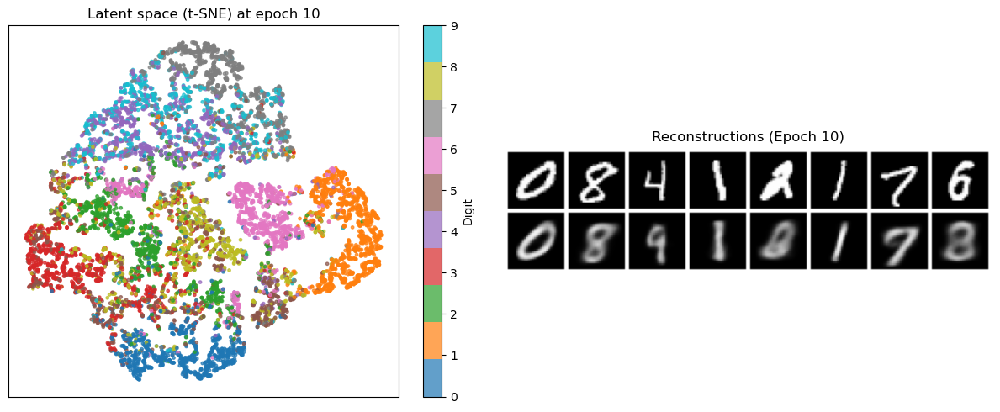

Epoch 11 | Loss 152.4872 | Recon 142.0160 | KL 10.4711
Epoch 12 | Loss 152.0013 | Recon 141.4233 | KL 10.5780
Epoch 13 | Loss 151.6430 | Recon 140.9409 | KL 10.7021
Epoch 14 | Loss 151.2939 | Recon 140.4828 | KL 10.8111
Epoch 15 | Loss 151.0089 | Recon 140.0803 | KL 10.9287
Epoch 16 | Loss 150.7169 | Recon 139.6986 | KL 11.0183
Epoch 17 | Loss 150.3685 | Recon 139.2881 | KL 11.0805
Epoch 18 | Loss 150.1465 | Recon 138.9799 | KL 11.1666
Epoch 19 | Loss 149.9467 | Recon 138.6646 | KL 11.2820
Epoch 20 | Loss 149.6917 | Recon 138.3663 | KL 11.3253


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


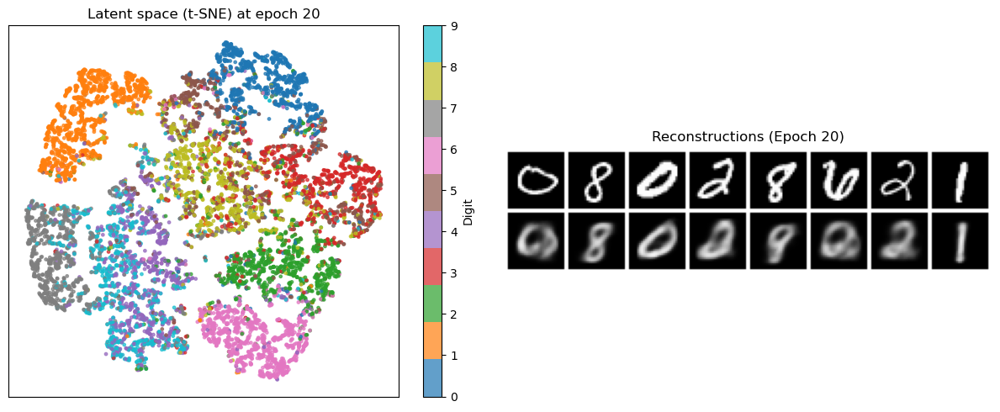

/Users/signeolsen/Desktop/deep_project_group_38/notebooks/plotting.py:326: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


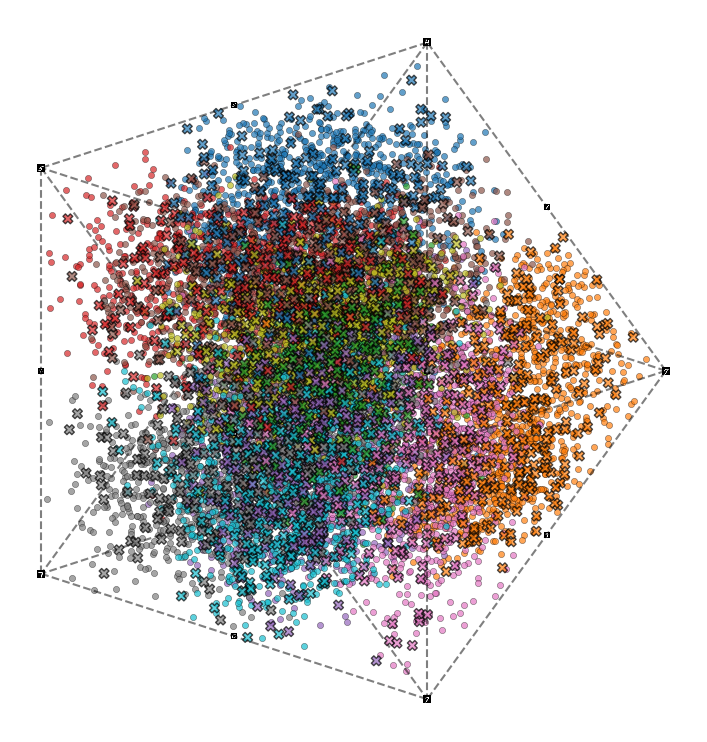

In [24]:
from plotting import plot_dirvae_archetypes, _get_latents_and_recons
import torchvision
import torchvision.transforms as T

# Use the images aligned with z_train
images_train = xb_train  # already [N, 1, 28, 28]
images_test = xb_test    # optional for test set


# Define the transform
transform = T.Compose([T.ToTensor(), lambda t: t.view(-1)])  # flatten 28x28 -> 784

# Training and test datasets
trainset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
testset = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)

# Make sure 'device' is defined
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Get latent vectors and images
z_train, labels_train, xb_train, _ = _get_latents_and_recons(model, trainset, device, n_samples=10000)
z_test, labels_test, xb_test, _ = _get_latents_and_recons(model, testset, device, n_samples=2000)

model = train_dirvae(epochs=20, latent_dim=5)

# Get latent vectors and images from your training dataset
z_train, labels_train, xb_train, _ = _get_latents_and_recons(model, trainset, device, n_samples=10000)
z_test, labels_test, xb_test, _ = _get_latents_and_recons(model, testset, device, n_samples=2000)

labels_train = labels_train.cpu().numpy().astype(int) if torch.is_tensor(labels_train) else labels_train
labels_test = labels_test.cpu().numpy().astype(int) if torch.is_tensor(labels_test) else labels_test

# Get all MNIST images corresponding to z_train
images_train_full = torch.stack([trainset[i][0] for i in range(len(z_train))])

# Plot the DirVAE archetypes and midpoints
plot_dirvae_archetypes(
    z_train=z_train,
    z_test=z_test,
    labels_train=labels_train,
    labels_test=labels_test,
    images_train=images_train_full,
    images_test=xb_test,
    midpoints=True,
)


z_train: torch.Size([10000, 5]) xb_train: torch.Size([8, 784])
z_test: torch.Size([2000, 5]) xb_test: torch.Size([8, 784])


IndexError: index 4813 is out of bounds for dimension 0 with size 8

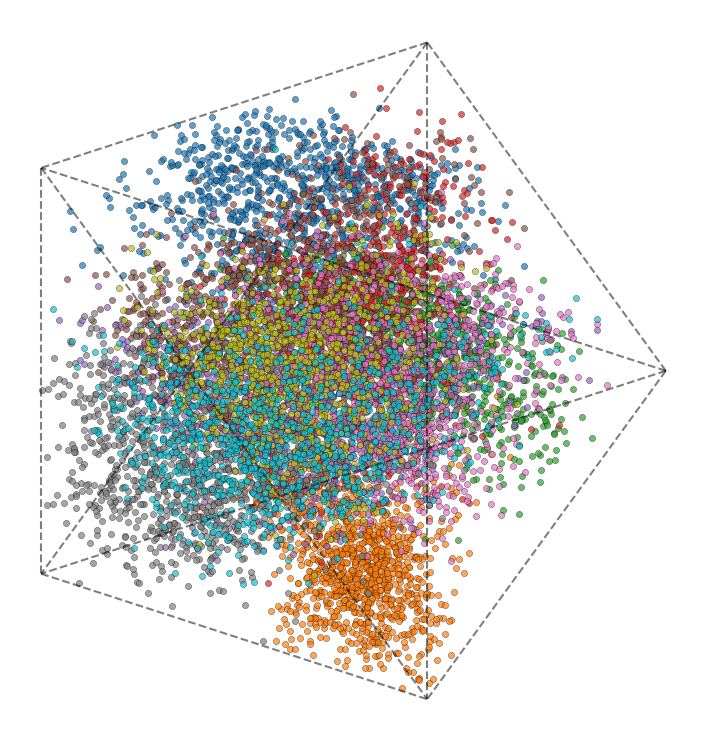

In [23]:
from plotting import plot_dirvae_archetypes, _get_latents_and_recons
import torchvision
import torchvision.transforms as T
import torch

# --- 1. Setup device ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- 2. Define MNIST transform ---
# Flatten images for the model
transform = T.Compose([
    T.ToTensor(),           # convert to float tensor [0,1]
    lambda t: t.view(-1)    # flatten 28x28 -> 784
])

# --- 3. Load datasets ---
trainset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
testset  = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)

# --- 4. Get all latent vectors and images ---
# n_samples should be large enough to cover all desired points for plotting
z_train, labels_train, xb_train, _ = _get_latents_and_recons(model, trainset, device, n_samples=10000)
z_test, labels_test, xb_test, _    = _get_latents_and_recons(model, testset, device, n_samples=2000)

# Check shapes to make sure everything is aligned
print("z_train:", z_train.shape, "xb_train:", xb_train.shape)
print("z_test:", z_test.shape, "xb_test:", xb_test.shape)

# --- 5. Convert labels to numpy ---
labels_train = labels_train.cpu().numpy().astype(int) if torch.is_tensor(labels_train) else labels_train
labels_test  = labels_test.cpu().numpy().astype(int) if torch.is_tensor(labels_test) else labels_test

# --- 6. Plot DirVAE archetypes and midpoints ---
plot_dirvae_archetypes(
    z_train=z_train,       # full training latent vectors
    z_test=z_test,         # full test latent vectors
    labels_train=labels_train,
    labels_test=labels_test,
    images_train=xb_train, # aligned images
    images_test=xb_test,   # optional
    midpoints=True,
)

Epoch 01 | Loss 203.5953 | Recon 200.8834 | KL 2.7120
Epoch 02 | Loss 190.7621 | Recon 187.0024 | KL 3.7598
Epoch 03 | Loss 189.3336 | Recon 184.9449 | KL 4.3887
Epoch 04 | Loss 188.4953 | Recon 183.7755 | KL 4.7198
Epoch 05 | Loss 187.9802 | Recon 183.0017 | KL 4.9785
Epoch 06 | Loss 187.6744 | Recon 182.4584 | KL 5.2161
Epoch 07 | Loss 187.3453 | Recon 181.9249 | KL 5.4204
Epoch 08 | Loss 187.0074 | Recon 181.4082 | KL 5.5992
Epoch 09 | Loss 186.6819 | Recon 180.9298 | KL 5.7521
Epoch 10 | Loss 186.5486 | Recon 180.5898 | KL 5.9588


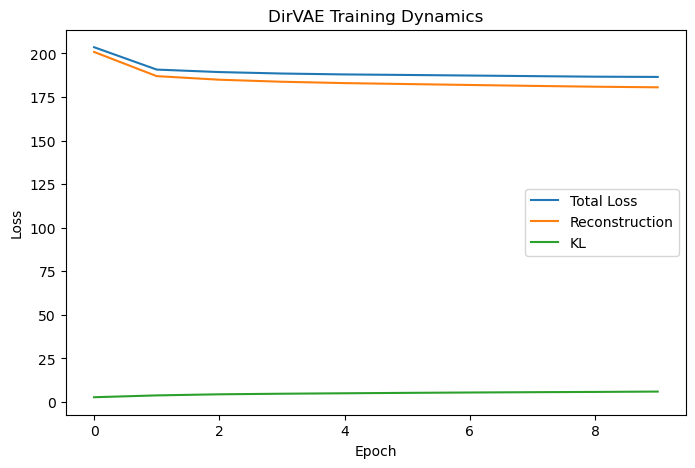

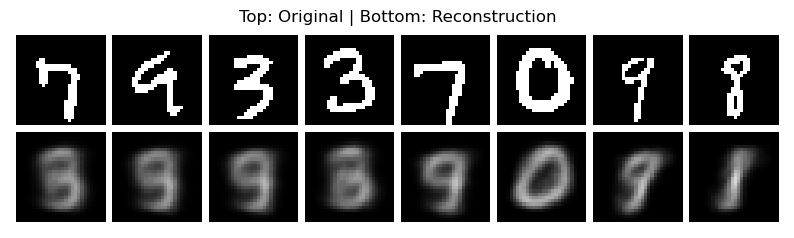

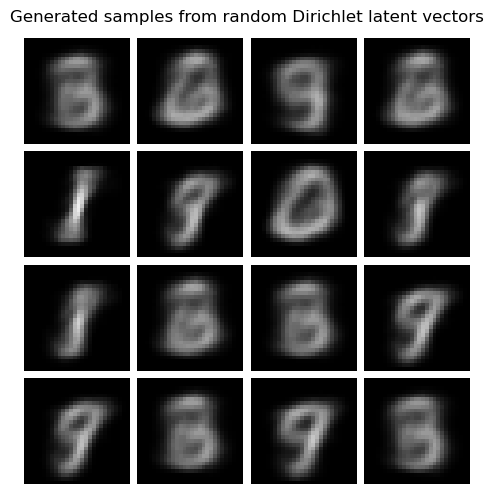

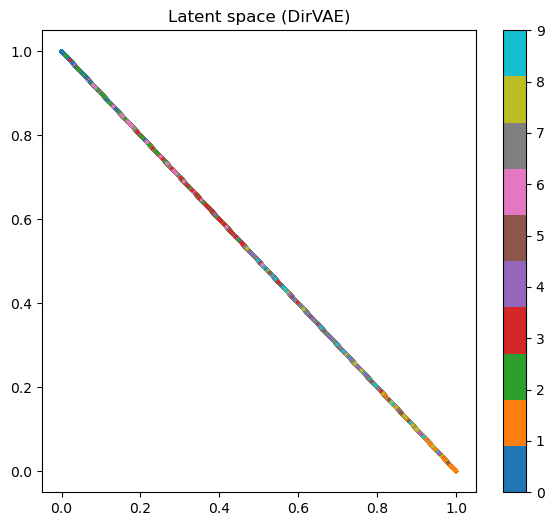

Running t-SNE projection...


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


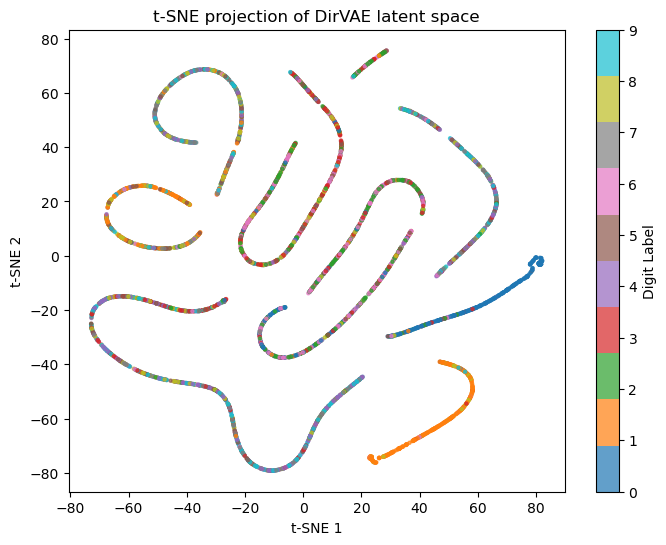

In [15]:
if __name__ == "__main__":
    model = train_dirvae(epochs=10, latent_dim=2)
    from torchvision import datasets, transforms
    transform = transforms.Compose([transforms.ToTensor(), lambda t: (t > 0.5).float(), lambda t: t.view(-1)])
    mnist = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
    plot_latent_tsne(model, mnist)

Epoch 01 | Loss 198.2602 | Recon 194.6035 | KL 3.6566
Epoch 02 | Loss 178.7125 | Recon 173.5846 | KL 5.1279
Epoch 03 | Loss 176.7431 | Recon 171.0903 | KL 5.6528
Epoch 04 | Loss 175.5191 | Recon 169.5258 | KL 5.9933
Epoch 05 | Loss 174.6376 | Recon 168.2955 | KL 6.3421
Epoch 06 | Loss 173.7885 | Recon 167.1488 | KL 6.6397
Epoch 07 | Loss 172.9480 | Recon 166.0532 | KL 6.8947
Epoch 08 | Loss 172.2096 | Recon 165.0835 | KL 7.1261
Epoch 09 | Loss 171.5391 | Recon 164.1682 | KL 7.3710
Epoch 10 | Loss 170.8653 | Recon 163.2469 | KL 7.6185


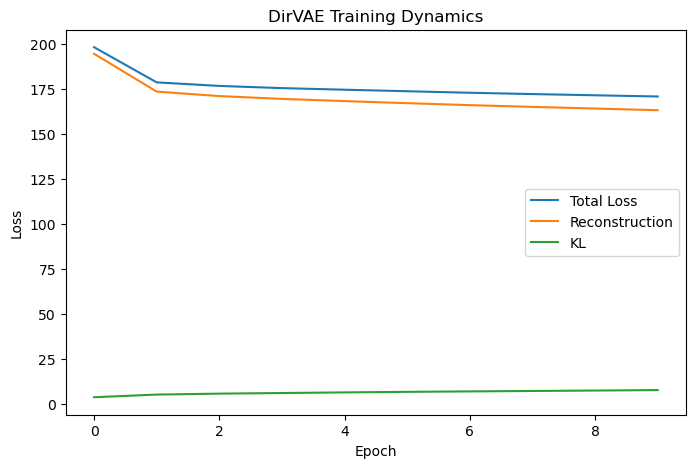

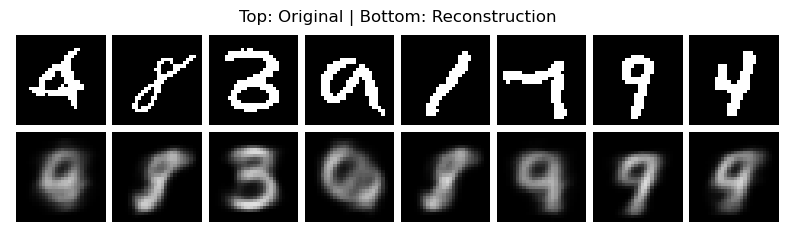

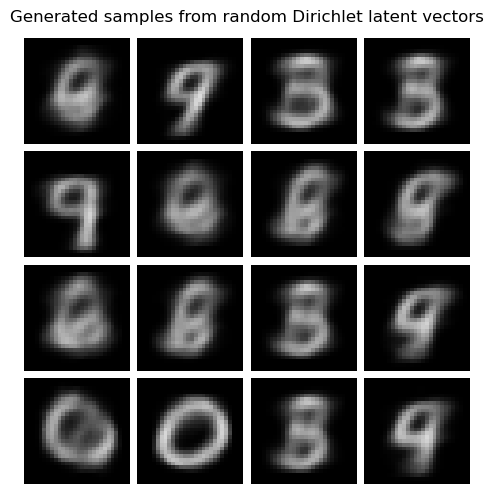

Running t-SNE projection...


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


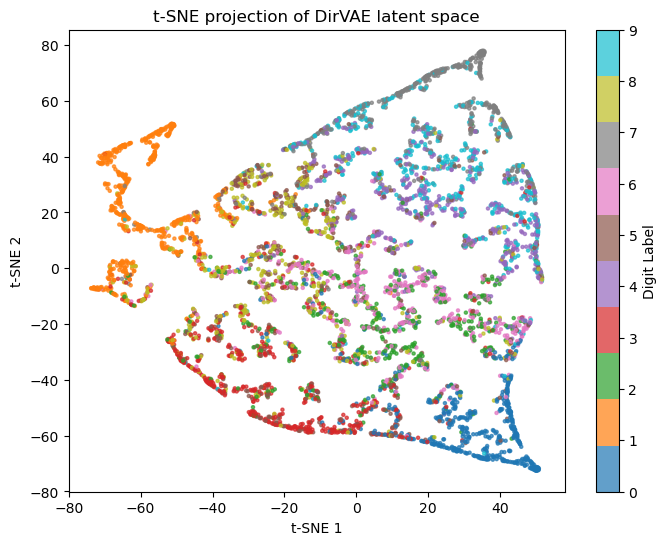

In [16]:
if __name__ == "__main__":
    model = train_dirvae(epochs=10, latent_dim=3)
    from torchvision import datasets, transforms
    transform = transforms.Compose([transforms.ToTensor(), lambda t: (t > 0.5).float(), lambda t: t.view(-1)])
    mnist = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
    plot_latent_tsne(model, mnist)

In [18]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from sklearn.manifold import TSNE, MDS
import umap
from torch.utils.data import DataLoader
from tqdm import tqdm

def plot_latent_projections(model, dataset, device=None, max_samples=5000):
    """
    Visualizes the latent space using t-SNE, UMAP, and MDS.

    Args:
        model: trained VAE or DirVAE model with encoder.
        dataset: torch.utils.data.Dataset (e.g. MNIST)
        device: torch.device (optional)
        max_samples: int, maximum number of samples for visualization.
    """
    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()

    loader = DataLoader(dataset, batch_size=512, shuffle=True)
    zs, labels = [], []

    with torch.no_grad():
        for xb, yb in tqdm(loader, desc="Extracting latents"):
            xb = xb.to(device)
            try:
                _, z, _, _ = model(xb)
            except:
                z = model.encode(xb)
            zs.append(z.cpu())
            labels.append(yb)
            if len(torch.cat(zs)) >= max_samples:
                break

    z = torch.cat(zs)[:max_samples]
    y = torch.cat(labels)[:max_samples]

    z_np = z.numpy()
    y_np = y.numpy()

    # --- Dimensionality reduction ---
    print("Computing t-SNE, UMAP, and MDS projections...")
    tsne_z = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(z_np)
    umap_z = umap.UMAP(n_components=2, random_state=42).fit_transform(z_np)
    mds_z = MDS(n_components=2, random_state=42, n_init=1, max_iter=200).fit_transform(z_np)

    # --- Plot ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    methods = [("t-SNE", tsne_z), ("UMAP", umap_z), ("MDS", mds_z)]

    for ax, (name, proj) in zip(axes, methods):
        scatter = ax.scatter(proj[:, 0], proj[:, 1], c=y_np, cmap="tab10", s=4, alpha=0.7)
        ax.set_title(f"{name} projection of latent space", fontsize=13)
        ax.set_xticks([]); ax.set_yticks([])

    fig.colorbar(scatter, ax=axes, location="right", fraction=0.02, pad=0.02)
    plt.tight_layout()
    plt.show()

Epoch 01 | Loss 201.4260 | Recon 196.5497 | KL 4.8763
Epoch 02 | Loss 156.5329 | Recon 147.6369 | KL 8.8960
Epoch 03 | Loss 148.8467 | Recon 138.5275 | KL 10.3192
Epoch 04 | Loss 144.0334 | Recon 132.5663 | KL 11.4672
Epoch 05 | Loss 141.1750 | Recon 129.0500 | KL 12.1250
Epoch 06 | Loss 138.8728 | Recon 126.3009 | KL 12.5720
Epoch 07 | Loss 136.7339 | Recon 123.7632 | KL 12.9707
Epoch 08 | Loss 134.7074 | Recon 121.4070 | KL 13.3004
Epoch 09 | Loss 132.8624 | Recon 119.2296 | KL 13.6328
Epoch 10 | Loss 131.1351 | Recon 117.2454 | KL 13.8897


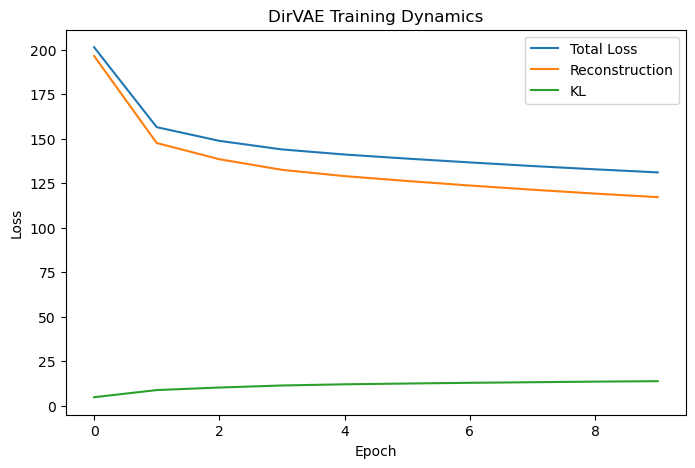

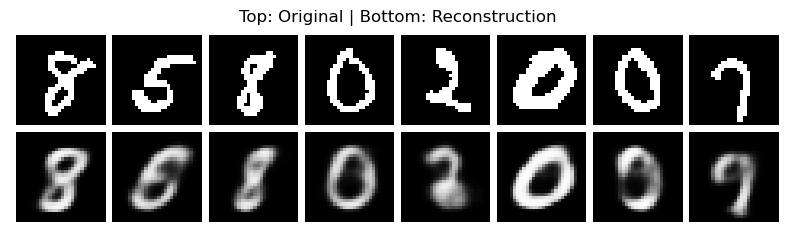

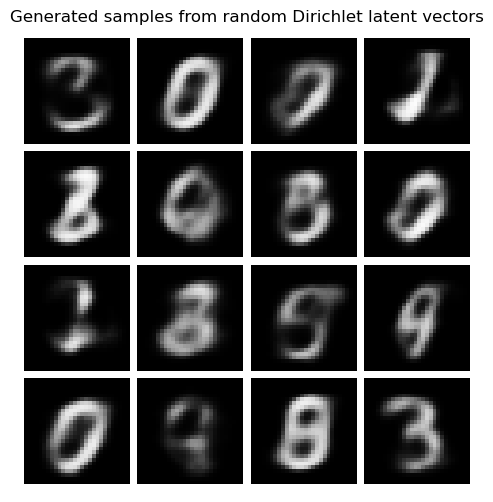

Extracting latents:   8%|▊         | 9/118 [00:00<00:04, 27.02it/s]


Computing t-SNE, UMAP, and MDS projections...


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/var/folders/w4/drmx799s2w14d7q5v4w2_y_r0000gn/T/ipykernel_12916/1956381589.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


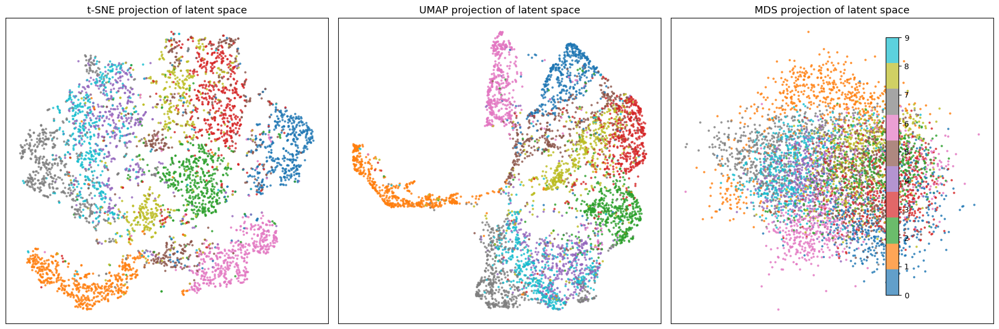

In [19]:
if __name__ == "__main__":
    model = train_dirvae(epochs=10, latent_dim=10)
    from torchvision import datasets, transforms

    transform = transforms.Compose([
        transforms.ToTensor(),
        lambda t: (t > 0.5).float(),
        lambda t: t.view(-1)
    ])
    mnist = datasets.MNIST(root='./data', train=True, download=True, transform=transform)

    plot_latent_projections(model, mnist)


In [34]:
def plot_dirichlet_simplex(model, dataset, device=None, n_points=5000, bw=0.05, cmap="viridis"):
    """
    Visualize Dirichlet latent space (3D) projected onto a 2D simplex density heatmap.
    Works like plot_latent_tsne(), but for Dirichlet-based VAEs.

    Args:
        model: trained DirVAE model.
        dataset: dataset (torchvision Dataset) to sample inputs from.
        device: torch.device or None.
        n_points: number of samples to use for visualization.
        bw: bandwidth for KDE.
        cmap: colormap for density.
    """
    import torch, numpy as np, matplotlib.pyplot as plt
    from torch.utils.data import DataLoader
    from scipy.stats import gaussian_kde
    from matplotlib.path import Path

    device = device or torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.eval()

    # --- collect latents and labels ---
    loader = DataLoader(dataset, batch_size=512, shuffle=True)
    zs, labels = [], []
    for xb, yb in loader:
        xb = xb.to(device)
        with torch.no_grad():
            _, z, _, _ = model(xb)
        zs.append(z.cpu())
        labels.append(yb)
        if len(torch.cat(zs)) > n_points:
            break
    z = torch.cat(zs)[:n_points]
    labels = torch.cat(labels)[:n_points]

    # --- keep first 3 components ---
    if z.shape[1] > 3:
        print(f"Latent dim = {z.shape[1]}, using first 3 dims for simplex projection.")
        z = z[:, :3]

    # normalize to simplex
    z = torch.clamp(z, min=1e-8)
    z = z / z.sum(dim=1, keepdim=True)

    # --- project to 2D barycentric coordinates ---
    x = z[:, 1] + 0.5 * z[:, 2]
    y = (np.sqrt(3)/2) * z[:, 2]
    xy = np.stack([x.numpy(), y.numpy()], axis=0)

    # --- project to 2D barycentric coordinates ---
    x = z[:, 1] + 0.5 * z[:, 2]
    y = (np.sqrt(3)/2) * z[:, 2]

    # --- plotting ---
    fig, ax = plt.subplots(figsize=(6,5))

    # outline
    verts = np.array([[0,0], [1,0], [0.5, np.sqrt(3)/2]])
    ax.plot(*np.vstack([verts, verts[0]]).T, color="black", lw=1.5)

    # scatter points colored by class
    scatter = ax.scatter(x, y, c=labels, cmap="tab10", s=12, alpha=0.7)

    # colorbar
    fig.colorbar(scatter, ax=ax, ticks=range(10), label="Digit")

    # labels
    ax.text(-0.05, -0.05, "Comp 1", ha="right", va="top", fontsize=10)
    ax.text(1.05, -0.05, "Comp 2", ha="left", va="top", fontsize=10)
    ax.text(0.5, np.sqrt(3)/2 + 0.05, "Comp 3", ha="center", va="bottom", fontsize=10)

    ax.set_xlim(0,1)
    ax.set_ylim(0, np.sqrt(3)/2)
    ax.set_aspect("equal")
    ax.axis("off")
    ax.set_title("Dirichlet simplex latent projection by class", fontsize=12)
    plt.tight_layout()
    plt.show()

Epoch 01 | Loss 197.6721 | Recon 193.8217 | KL 3.8503
Epoch 02 | Loss 179.2499 | Recon 173.9159 | KL 5.3339
Epoch 03 | Loss 177.4036 | Recon 171.4397 | KL 5.9639
Epoch 04 | Loss 176.1872 | Recon 169.8312 | KL 6.3560
Epoch 05 | Loss 175.1433 | Recon 168.4259 | KL 6.7173
Epoch 06 | Loss 174.1192 | Recon 167.1063 | KL 7.0129
Epoch 07 | Loss 173.2675 | Recon 165.9458 | KL 7.3218
Epoch 08 | Loss 172.4966 | Recon 164.8812 | KL 7.6154
Epoch 09 | Loss 171.7489 | Recon 163.9196 | KL 7.8293
Epoch 10 | Loss 171.2771 | Recon 163.2180 | KL 8.0590
Epoch 11 | Loss 170.6445 | Recon 162.4871 | KL 8.1575
Epoch 12 | Loss 170.2428 | Recon 161.8876 | KL 8.3552
Epoch 13 | Loss 169.9724 | Recon 161.4598 | KL 8.5126
Epoch 14 | Loss 169.5814 | Recon 160.9678 | KL 8.6136
Epoch 15 | Loss 169.2706 | Recon 160.5608 | KL 8.7098
Epoch 16 | Loss 168.9231 | Recon 160.1236 | KL 8.7995
Epoch 17 | Loss 168.8589 | Recon 159.8793 | KL 8.9796
Epoch 18 | Loss 168.5462 | Recon 159.4939 | KL 9.0523
Epoch 19 | Loss 168.2998 | R

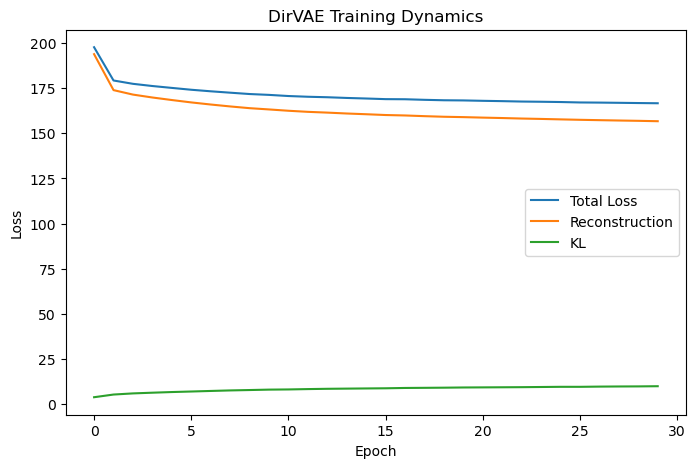

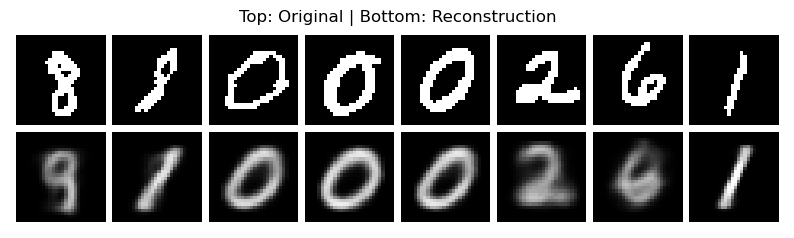

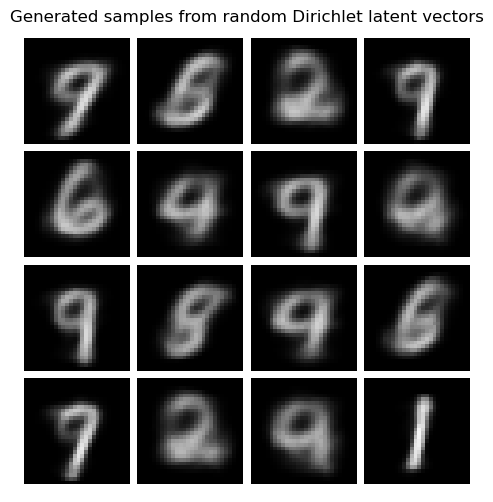

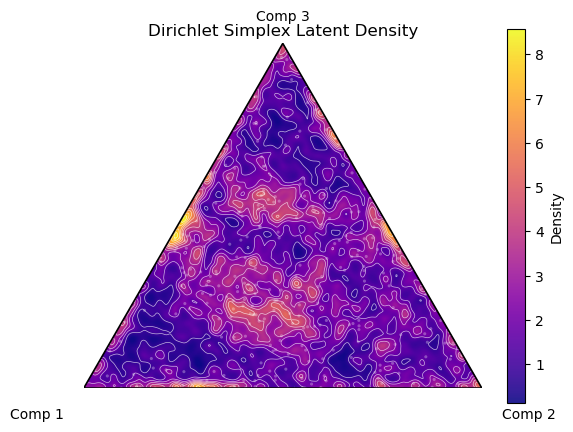

In [28]:
if __name__ == "__main__":
    model = train_dirvae(epochs=30, latent_dim=3)
    from torchvision import datasets, transforms
    transform = transforms.Compose([transforms.ToTensor(), lambda t: (t > 0.5).float(), lambda t: t.view(-1)])
    mnist = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
    plot_dirichlet_simplex(model, mnist)

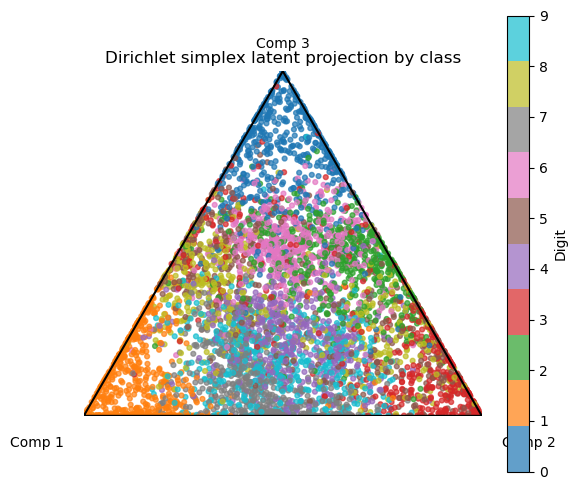

In [35]:
if __name__ == "__main__":
    #model = train_dirvae(epochs=10, latent_dim=3)
    from torchvision import datasets, transforms
    transform = transforms.Compose([transforms.ToTensor(), lambda t: (t > 0.5).float(), lambda t: t.view(-1)])
    mnist = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
    plot_dirichlet_simplex(model, mnist)

Epoch 01 | Loss 198.6014 | Recon 194.6589 | KL 3.9426
Epoch 02 | Loss 178.7387 | Recon 173.3928 | KL 5.3459
Epoch 03 | Loss 177.1410 | Recon 171.3482 | KL 5.7928
Epoch 04 | Loss 176.2106 | Recon 170.0190 | KL 6.1916
Epoch 05 | Loss 175.3770 | Recon 168.8869 | KL 6.4901
Epoch 06 | Loss 174.6437 | Recon 167.8283 | KL 6.8154
Epoch 07 | Loss 174.0367 | Recon 166.9542 | KL 7.0825
Epoch 08 | Loss 173.5273 | Recon 166.2171 | KL 7.3102
Epoch 09 | Loss 173.0293 | Recon 165.5111 | KL 7.5183
Epoch 10 | Loss 172.5558 | Recon 164.8733 | KL 7.6825


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


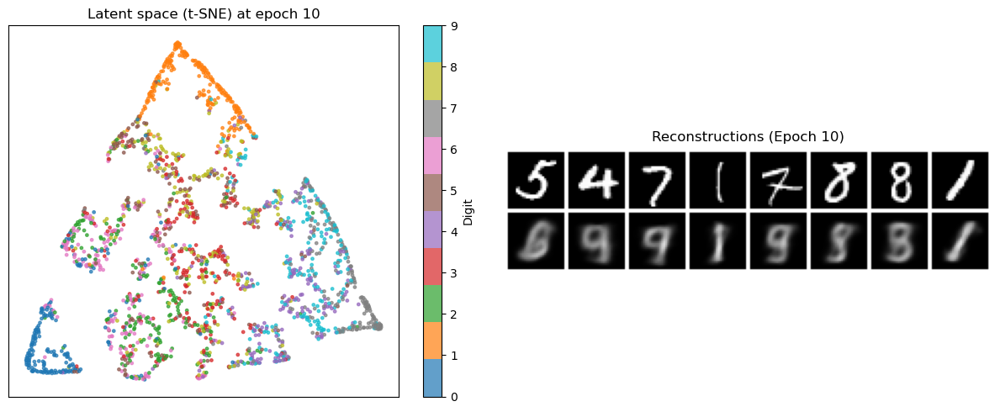

Computing embeddings: t-SNE, UMAP, MDS...


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


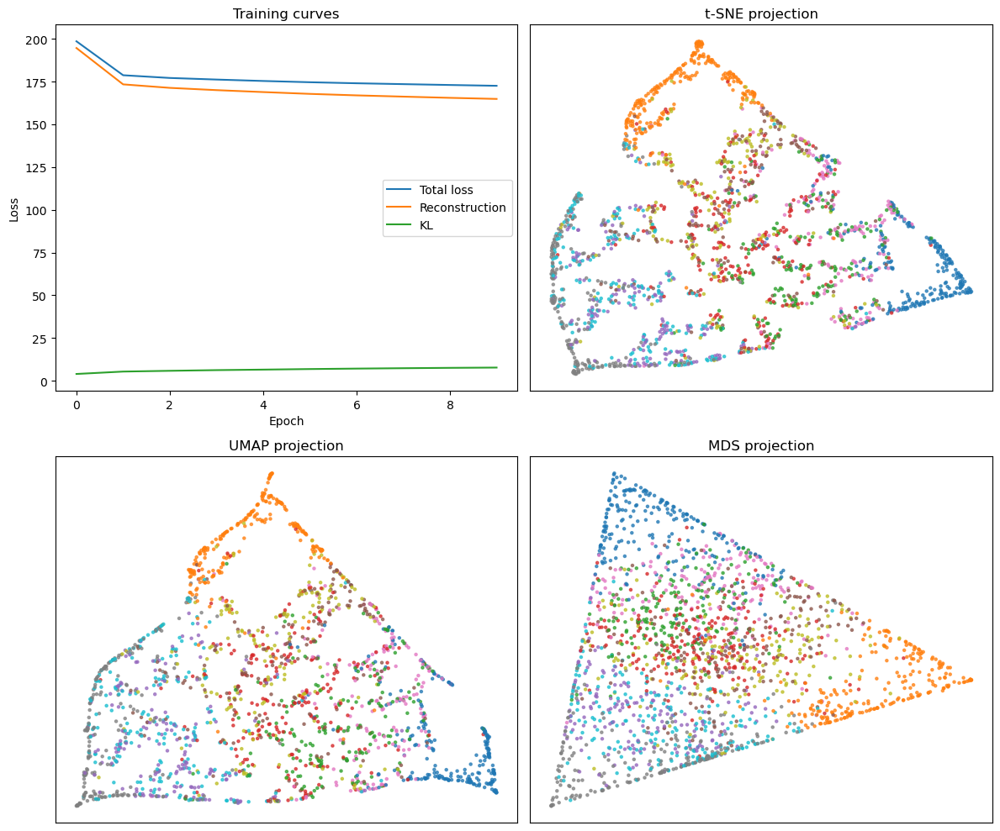

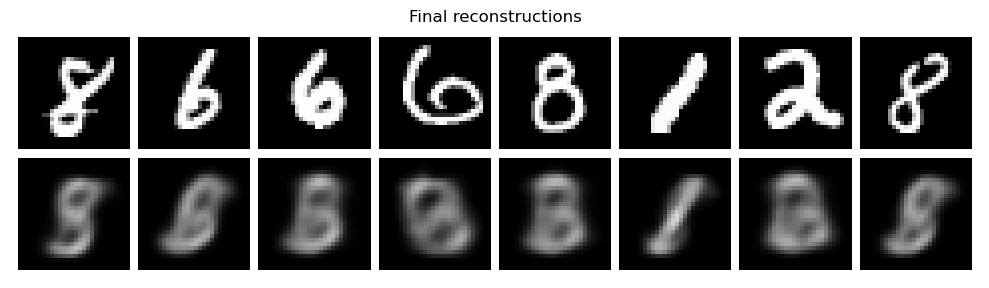

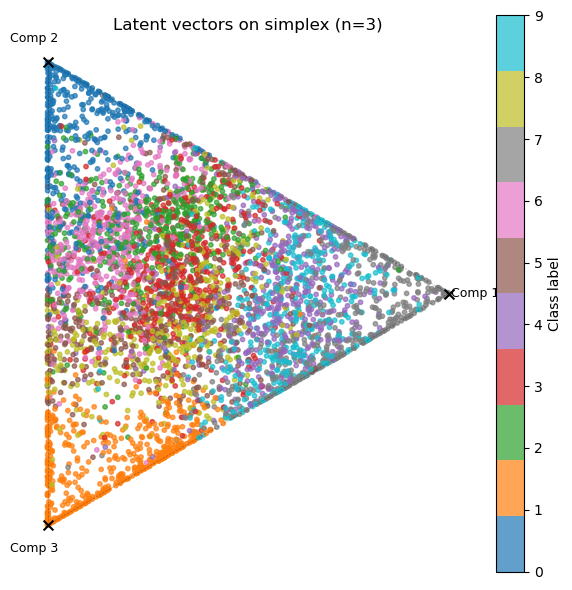

In [6]:
model = train_dirvae(epochs=10, latent_dim=3)

Epoch 01 | Loss 231.0817 | Recon 230.9054 | KL 0.1763
Epoch 02 | Loss 199.4209 | Recon 197.0605 | KL 2.3605
Epoch 03 | Loss 192.1380 | Recon 189.2125 | KL 2.9255
Epoch 04 | Loss 184.6230 | Recon 179.8201 | KL 4.8028
Epoch 05 | Loss 176.1164 | Recon 170.0456 | KL 6.0709
Epoch 06 | Loss 171.1444 | Recon 164.3219 | KL 6.8225
Epoch 07 | Loss 164.6641 | Recon 156.3257 | KL 8.3384
Epoch 08 | Loss 156.7886 | Recon 146.3800 | KL 10.4085
Epoch 09 | Loss 152.0869 | Recon 141.0239 | KL 11.0630
Epoch 10 | Loss 149.1202 | Recon 137.5562 | KL 11.5641


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


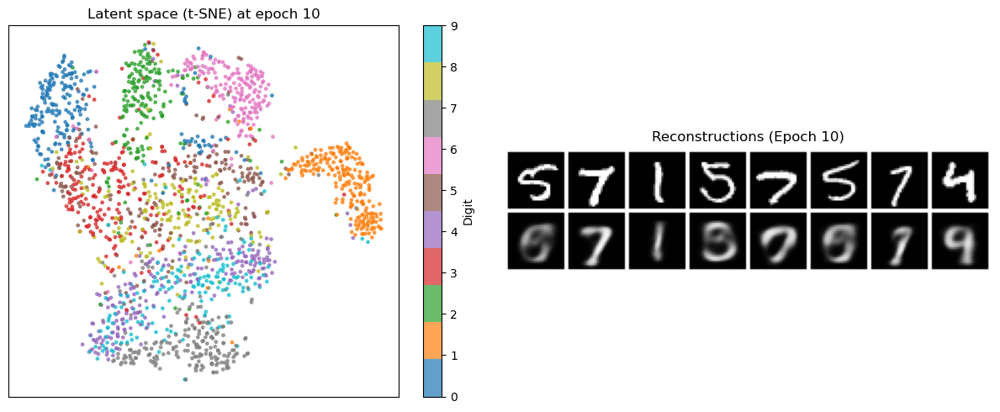

Epoch 11 | Loss 146.2575 | Recon 134.1229 | KL 12.1346
Epoch 12 | Loss 143.2458 | Recon 130.4609 | KL 12.7850
Epoch 13 | Loss 140.4307 | Recon 127.0076 | KL 13.4231
Epoch 14 | Loss 138.0377 | Recon 124.0741 | KL 13.9635
Epoch 15 | Loss 136.0624 | Recon 121.6356 | KL 14.4267
Epoch 16 | Loss 134.4193 | Recon 119.5937 | KL 14.8256
Epoch 17 | Loss 132.9496 | Recon 117.7899 | KL 15.1596
Epoch 18 | Loss 131.7485 | Recon 116.2886 | KL 15.4599
Epoch 19 | Loss 130.5255 | Recon 114.7917 | KL 15.7338
Epoch 20 | Loss 129.4625 | Recon 113.4833 | KL 15.9792


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


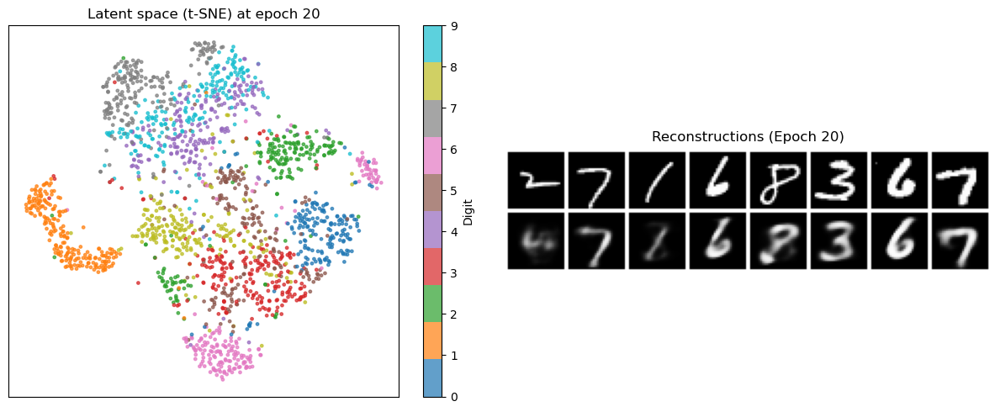

Epoch 21 | Loss 128.4007 | Recon 112.1696 | KL 16.2311
Epoch 22 | Loss 127.4253 | Recon 110.9856 | KL 16.4397
Epoch 23 | Loss 126.5862 | Recon 109.8976 | KL 16.6887
Epoch 24 | Loss 125.7173 | Recon 108.8327 | KL 16.8846
Epoch 25 | Loss 124.8693 | Recon 107.7515 | KL 17.1178
Epoch 26 | Loss 124.0362 | Recon 106.6918 | KL 17.3444
Epoch 27 | Loss 123.2507 | Recon 105.7249 | KL 17.5258
Epoch 28 | Loss 122.5630 | Recon 104.8686 | KL 17.6944
Epoch 29 | Loss 121.9229 | Recon 104.0649 | KL 17.8580
Epoch 30 | Loss 121.3355 | Recon 103.3457 | KL 17.9898


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


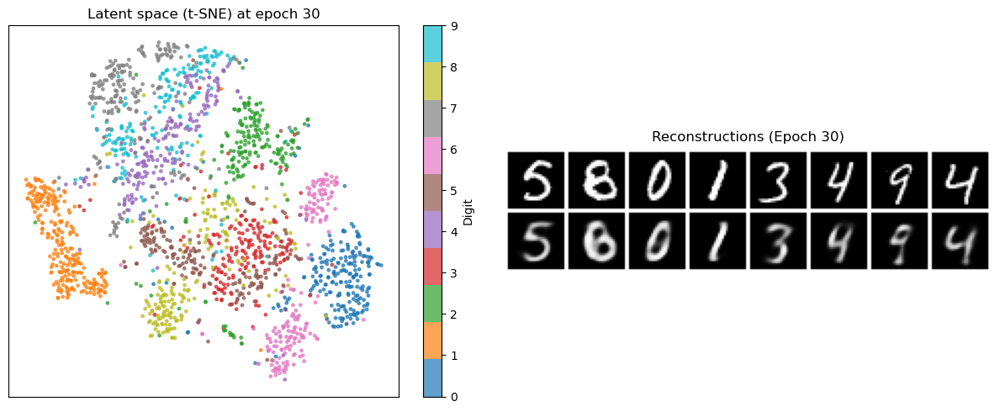

Epoch 31 | Loss 120.8315 | Recon 102.7016 | KL 18.1299
Epoch 32 | Loss 120.2764 | Recon 102.0264 | KL 18.2500
Epoch 33 | Loss 119.7774 | Recon 101.4348 | KL 18.3426
Epoch 34 | Loss 119.3490 | Recon 100.9186 | KL 18.4304
Epoch 35 | Loss 118.9471 | Recon 100.3925 | KL 18.5546
Epoch 36 | Loss 118.5838 | Recon 99.9160 | KL 18.6678
Epoch 37 | Loss 118.2337 | Recon 99.5274 | KL 18.7064
Epoch 38 | Loss 117.8789 | Recon 99.0855 | KL 18.7934
Epoch 39 | Loss 117.5531 | Recon 98.6999 | KL 18.8532
Epoch 40 | Loss 117.2350 | Recon 98.3011 | KL 18.9338


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


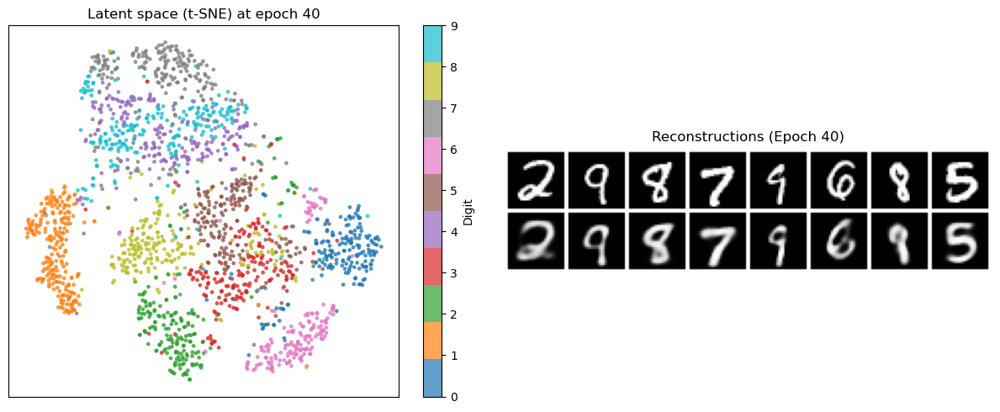

Epoch 41 | Loss 116.9735 | Recon 97.9755 | KL 18.9979
Epoch 42 | Loss 116.6229 | Recon 97.5738 | KL 19.0491
Epoch 43 | Loss 116.3805 | Recon 97.2845 | KL 19.0960
Epoch 44 | Loss 116.1778 | Recon 97.0119 | KL 19.1659
Epoch 45 | Loss 115.9257 | Recon 96.6773 | KL 19.2484
Epoch 46 | Loss 115.7256 | Recon 96.4498 | KL 19.2758
Epoch 47 | Loss 115.4439 | Recon 96.1244 | KL 19.3194
Epoch 48 | Loss 115.2230 | Recon 95.8817 | KL 19.3413
Epoch 49 | Loss 114.9916 | Recon 95.6010 | KL 19.3906
Epoch 50 | Loss 114.8190 | Recon 95.3770 | KL 19.4420


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


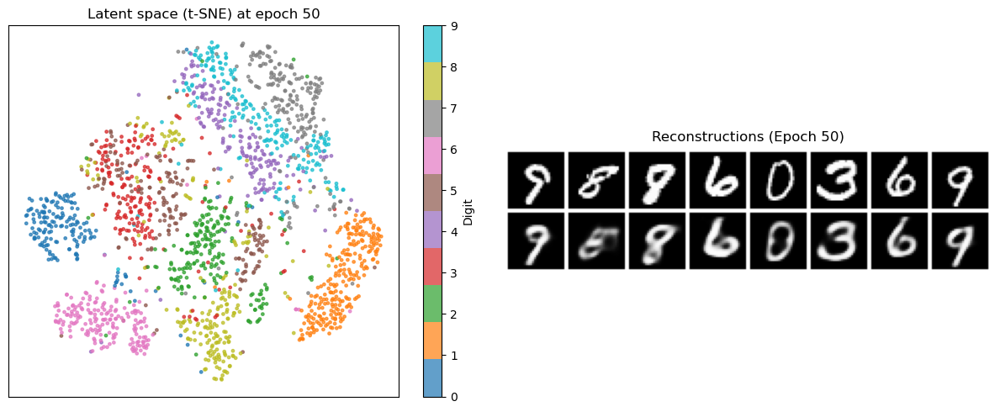

Computing embeddings: t-SNE, UMAP, MDS...


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


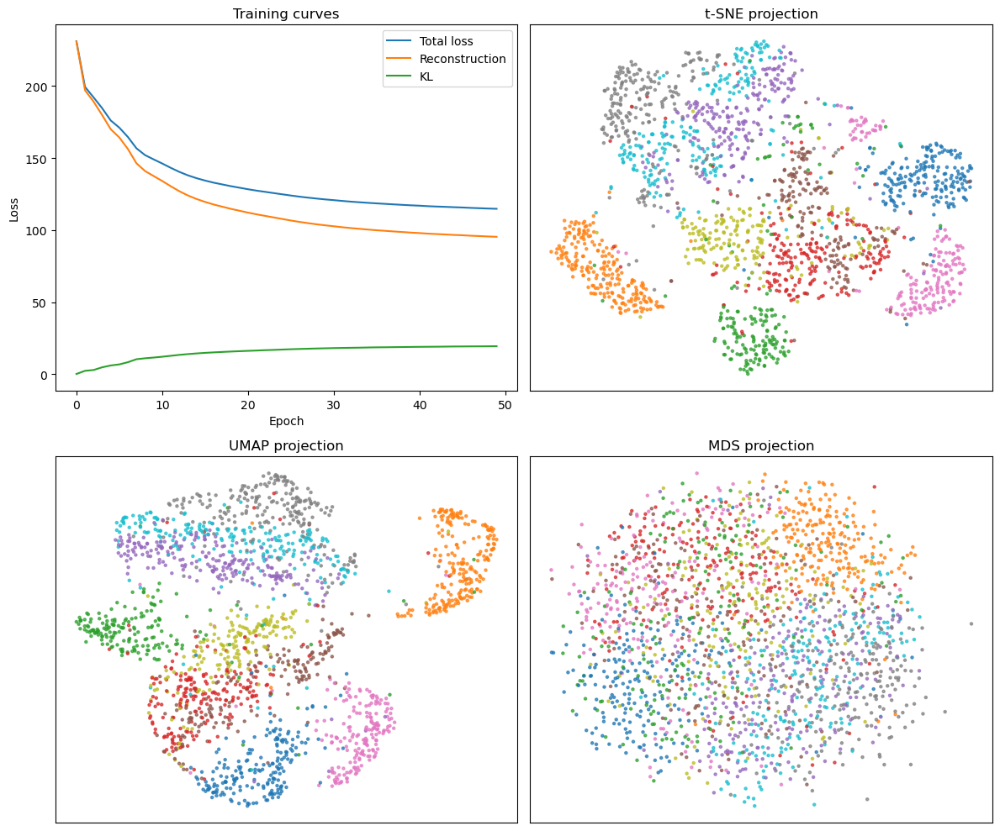

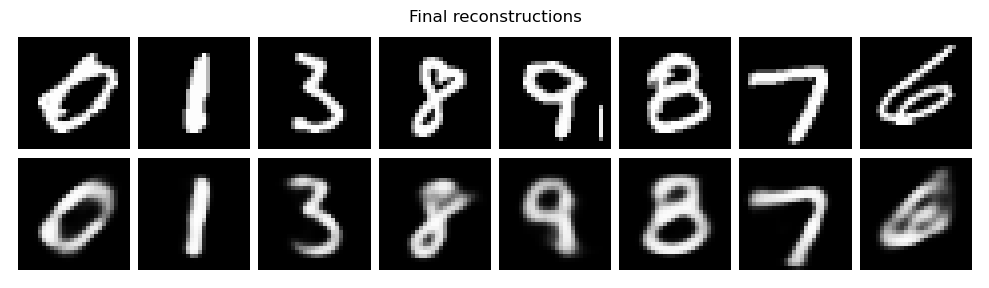

Latent dim = 50, reducing to 10D for visualization.


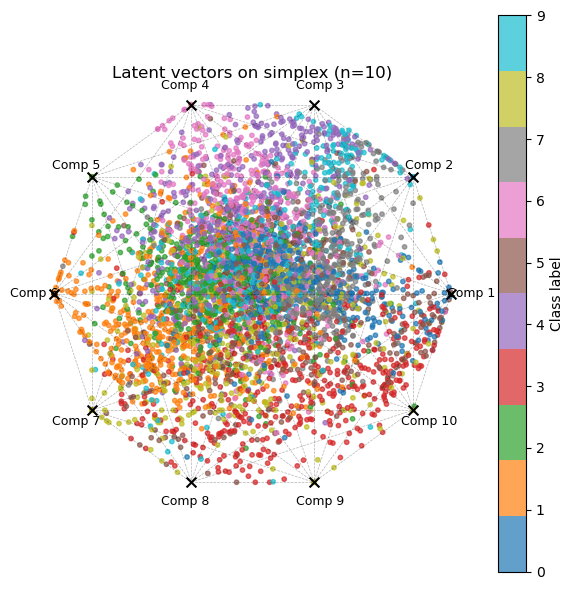

In [7]:
model = train_dirvae(epochs=50, latent_dim=50)

Epoch 01 | Loss 231.3955 | Recon 231.2458 | KL 0.1497
Epoch 02 | Loss 200.0887 | Recon 197.8772 | KL 2.2116
Epoch 03 | Loss 191.9327 | Recon 188.8819 | KL 3.0508
Epoch 04 | Loss 183.5174 | Recon 178.3909 | KL 5.1266
Epoch 05 | Loss 175.5823 | Recon 169.3441 | KL 6.2381
Epoch 06 | Loss 170.9588 | Recon 164.0454 | KL 6.9134
Epoch 07 | Loss 166.2707 | Recon 158.3756 | KL 7.8951
Epoch 08 | Loss 160.4735 | Recon 151.2700 | KL 9.2035
Epoch 09 | Loss 155.0903 | Recon 144.6921 | KL 10.3982
Epoch 10 | Loss 149.6444 | Recon 137.9766 | KL 11.6678


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


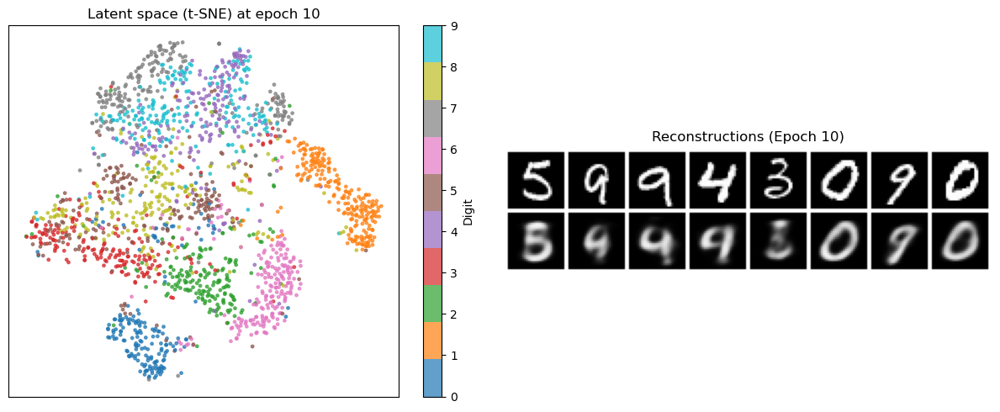

Epoch 11 | Loss 145.9984 | Recon 133.6967 | KL 12.3018
Epoch 12 | Loss 143.0015 | Recon 130.0775 | KL 12.9240
Epoch 13 | Loss 140.3186 | Recon 126.8280 | KL 13.4907
Epoch 14 | Loss 138.1257 | Recon 124.1212 | KL 14.0045
Epoch 15 | Loss 136.2233 | Recon 121.7222 | KL 14.5011
Epoch 16 | Loss 134.4833 | Recon 119.6428 | KL 14.8405
Epoch 17 | Loss 133.0496 | Recon 117.8608 | KL 15.1888
Epoch 18 | Loss 131.7265 | Recon 116.2515 | KL 15.4749
Epoch 19 | Loss 130.5323 | Recon 114.7644 | KL 15.7679
Epoch 20 | Loss 129.4219 | Recon 113.4009 | KL 16.0210


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


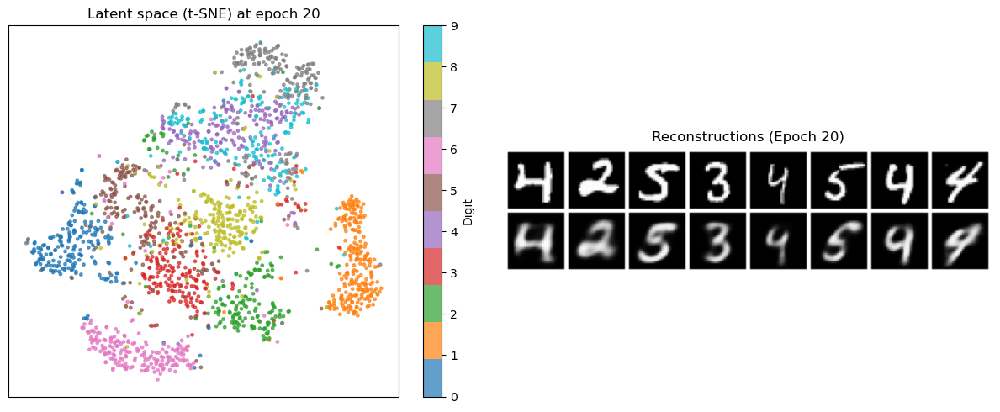

Epoch 21 | Loss 128.3937 | Recon 112.1104 | KL 16.2833
Epoch 22 | Loss 127.3319 | Recon 110.8219 | KL 16.5099
Epoch 23 | Loss 126.4345 | Recon 109.6968 | KL 16.7377
Epoch 24 | Loss 125.5674 | Recon 108.6212 | KL 16.9462
Epoch 25 | Loss 124.7418 | Recon 107.6055 | KL 17.1363
Epoch 26 | Loss 123.9061 | Recon 106.6336 | KL 17.2725
Epoch 27 | Loss 123.2672 | Recon 105.8083 | KL 17.4589
Epoch 28 | Loss 122.5789 | Recon 104.9782 | KL 17.6006
Epoch 29 | Loss 121.9134 | Recon 104.1744 | KL 17.7391
Epoch 30 | Loss 121.3259 | Recon 103.4375 | KL 17.8883


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


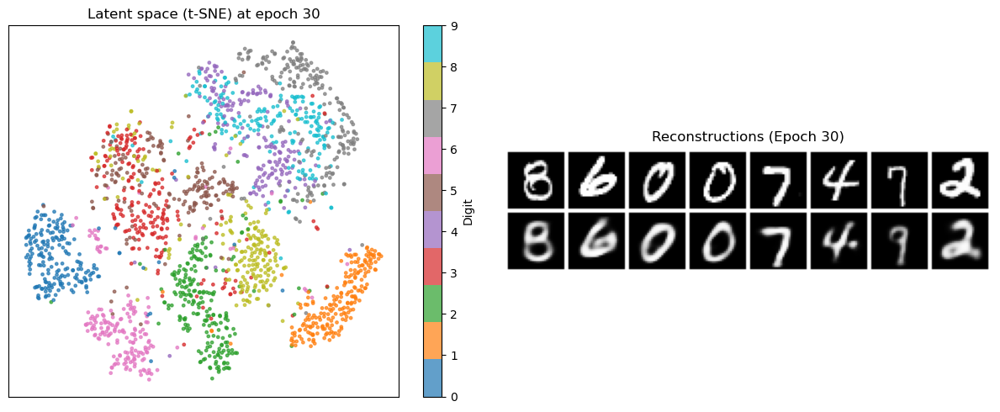

Epoch 31 | Loss 120.8649 | Recon 102.8032 | KL 18.0617
Epoch 32 | Loss 120.2996 | Recon 102.1499 | KL 18.1497
Epoch 33 | Loss 119.8079 | Recon 101.5687 | KL 18.2392
Epoch 34 | Loss 119.3378 | Recon 100.9727 | KL 18.3652
Epoch 35 | Loss 118.9330 | Recon 100.4910 | KL 18.4420
Epoch 36 | Loss 118.5076 | Recon 99.9750 | KL 18.5326
Epoch 37 | Loss 118.1900 | Recon 99.5785 | KL 18.6115
Epoch 38 | Loss 117.8333 | Recon 99.1489 | KL 18.6844
Epoch 39 | Loss 117.5096 | Recon 98.7442 | KL 18.7655
Epoch 40 | Loss 117.2040 | Recon 98.3722 | KL 18.8317


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


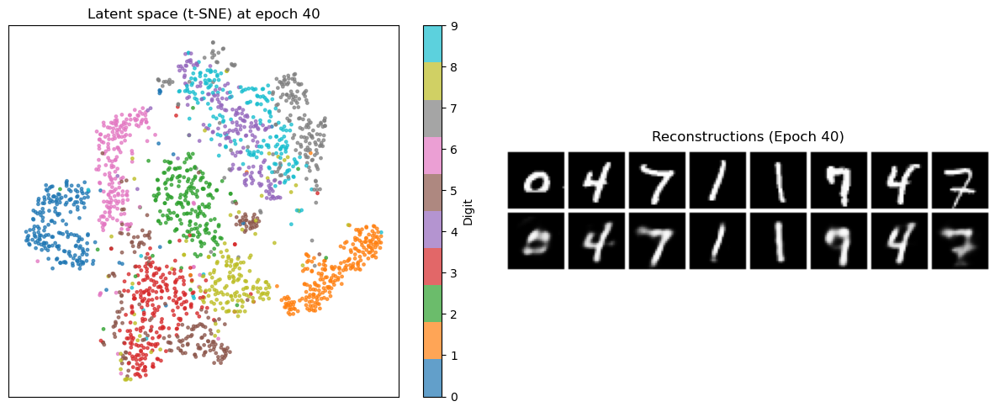

Epoch 41 | Loss 116.9456 | Recon 98.0156 | KL 18.9300
Epoch 42 | Loss 116.6941 | Recon 97.7226 | KL 18.9715
Epoch 43 | Loss 116.3488 | Recon 97.3608 | KL 18.9881
Epoch 44 | Loss 116.1433 | Recon 97.0763 | KL 19.0670
Epoch 45 | Loss 115.9196 | Recon 96.7966 | KL 19.1230
Epoch 46 | Loss 115.7151 | Recon 96.5170 | KL 19.1981
Epoch 47 | Loss 115.5058 | Recon 96.2790 | KL 19.2268
Epoch 48 | Loss 115.2449 | Recon 95.9998 | KL 19.2451
Epoch 49 | Loss 115.0630 | Recon 95.7856 | KL 19.2773
Epoch 50 | Loss 114.8338 | Recon 95.5380 | KL 19.2958


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


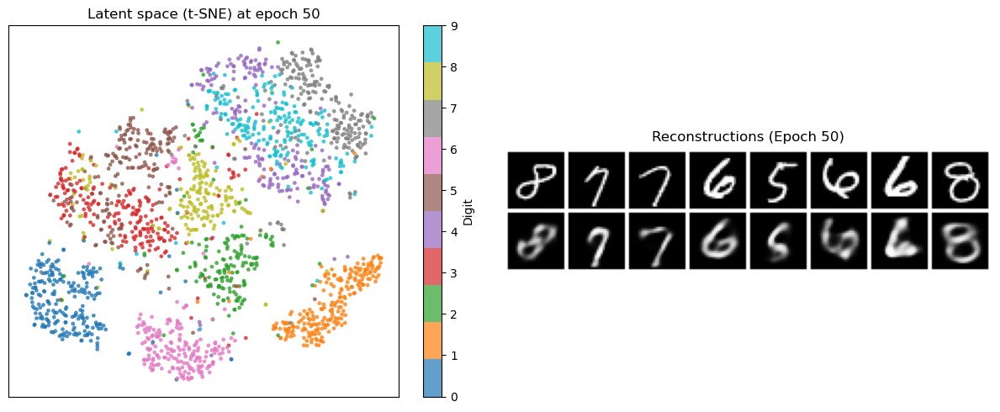

Computing embeddings: t-SNE, UMAP, MDS...


/Users/signeolsen/opt/anaconda3/envs/MachineLearning/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


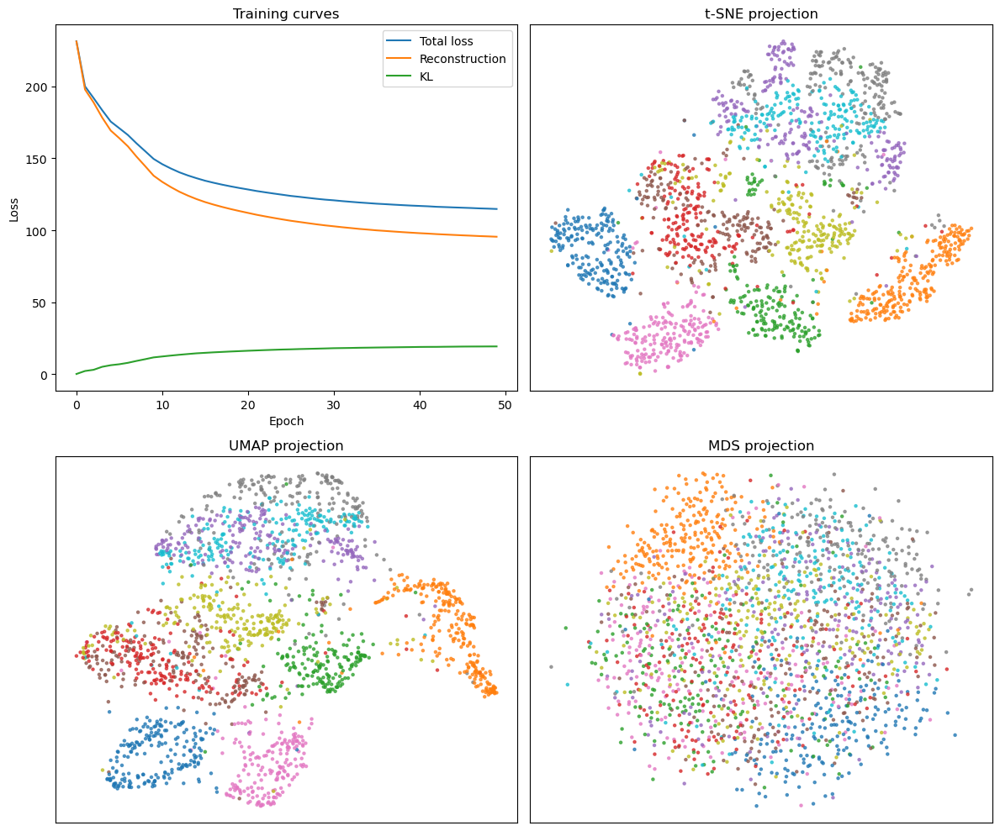

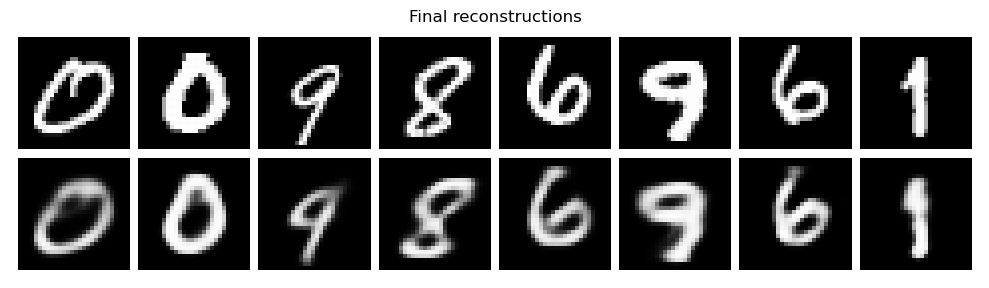

In [10]:
model = train_dirvae(epochs=50, latent_dim=50)